# Análisis de patrón de puntos

In [5]:
%matplotlib inline

import numpy
import pandas
import geopandas
import pysal
import seaborn
import contextily
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

from pointpats import centrography

## Introducción 

Los **puntos** son entidades espaciales que pueden entenderse de dos formas fundamentalmente diferentes. 

- Por un lado, los puntos pueden verse **como objetos fijos en el espacio**, es decir, su ubicación se toma como dada ( exógena). En esta interpretación, la ubicación de un punto observado se considera secundaria al valor observado en el punto. Piense en esto como medir el número de automóviles que atraviesan una intersección de carreteras determinada; la ubicación es fija y los datos de interés provienen de la medición realizada en esa ubicación. El análisis de este tipo de datos puntuales es muy similar al de otros tipos de datos espaciales como polígonos y líneas. 

- Por otro lado, **una observación que ocurre en un punto también se puede considerar como un sitio de medición a partir de un proceso geográficamente continuo subyacente**. En este caso, la medición podría teóricamente tener lugar en cualquier lugar, pero solo se llevó a cabo o se llevó a cabo en ciertos lugares. Piense en esto como medir la longitud de las alas de los pájaros: la ubicación en la que se miden las aves refleja el proceso geográfico subyacente del movimiento y la búsqueda de alimento de las aves, y la longitud de las alas de las aves puede reflejar un proceso ecológico subyacente que varía según el ave. **Este tipo de enfoque significa que tanto la ubicación como la medición son importantes**. Esta es la **perspectiva que adoptaremos en el resto del capítulo.** <=======

Cuando los puntos se ven como eventos que podrían tener lugar en varios lugares, pero que solo suceden en algunos de ellos, una colección de tales eventos se denomina patrón de puntos. En este caso, **la ubicación de los puntos es uno de los aspectos clave de interés para el análisis.**

Por ejemplo, en el caso de las *fotografías geoetiquetadas*: técnicamente podrían suceder en muchos lugares, pero generalmente encontramos que las fotos tienden a concentrarse solo en un puñado de ellas.

El análisis de patrones puntuales se ocupa, por tanto, de la visualización, descripción, caracterización estadística y modelado de patrones puntuales, tratando de comprender el proceso de generación que da origen y explica los datos observados. Las preguntas comunes en este dominio incluyen:

- ¿Cómo se ve el patrón?

- ¿Cuál es la naturaleza de la distribución de puntos?

- ¿Existe alguna estructura en la forma en que se organizan las ubicaciones en el espacio? Es decir, ¿se agrupan los eventos? o están dispersos?

- ¿Por qué ocurren los eventos en esos lugares y no en otros?

## El conjunto de datos de fotografías de Tokio

El surgimiento de nuevas formas de datos, como las fotos geoetiquetadas que se cargan en servicios en línea, está creando nuevas formas para que los investigadores estudien y comprendan las ciudades. 

¿Dónde toma la gente fotos? ¿Cuándo se toman esas fotos? ¿Por qué ciertos lugares atraen a muchos más fotógrafos que otros? T

En este capítulo exploraremos los metadatos de una muestra de imágenes georreferenciadas subidas a Flickr y extraídas gracias al conjunto de datos de Flickr de 100 m (https://webscope.sandbox.yahoo.com/catalog.php?datatype=i&did=67). Al hacerlo, presentaremos algunos enfoques que nos ayudarán a comprender mejor la distribución y las características de un patrón de puntos.

La tabla contiene la siguiente información sobre la muestra de 10,000 fotografías: 
- el DNI del usuario que tomó la foto; 
- la ubicación expresada como columnas de latitud y longitud; 
- una versión transformada de esas coordenadas expresadas en Pseudo Mercator; 
- la marca de tiempo cuando se tomó la foto; 
- y la URL donde se almacena en línea la imagen a la que hacen referencia:

In [6]:
db = pandas.read_csv('./data/tokyo_clean.csv')
db

,user_id,longitude,latitude,date_taken,photo/video_page_url,x,y
0,10727420@N00,139.700499,35.674000,2010-04-09 17:26:25.0,http://www.flickr.com/photos/10727420@N00/4545...,1.555139e+07,4.255856e+06
1,8819274@N04,139.766521,35.709095,2007-02-10 16:08:40.0,http://www.flickr.com/photos/8819274@N04/26503...,1.555874e+07,4.260667e+06
2,62068690@N00,139.765632,35.694482,2008-12-21 15:45:31.0,http://www.flickr.com/photos/62068690@N00/3125...,1.555864e+07,4.258664e+06
3,49503094041@N01,139.784391,35.548589,2011-11-11 05:48:54.0,http://www.flickr.com/photos/49503094041@N01/6...,1.556073e+07,4.238684e+06
4,40443199@N00,139.768753,35.671521,2006-04-06 16:42:49.0,http://www.flickr.com/photos/40443199@N00/2482...,1.555899e+07,4.255517e+06
...,...,...,...,...,...,...,...
9995,26981415@N00,139.582672,35.532785,2007-10-29 17:06:59.0,http://www.flickr.com/photos/26981415@N00/1797...,1.553827e+07,4.236522e+06
9996,36516818@N00,139.749461,35.696870,2006-08-26 13:59:06.0,http://www.flickr.com/photos/36516818@N00/2623...,1.555684e+07,4.258991e+06
9997,92996378@N00,139.770298,35.670336,2007-03-19 16:37:15.0,http://www.flickr.com/photos/92996378@N00/4321...,1.555916e+07,4.255354e+06
9998,95795770@N00,139.739075,35.642470,2008-08-13 17:12:36.0,http://www.flickr.com/photos/95795770@N00/2759...,1.555568e+07,4.251537e+06


In [7]:
db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   user_id               10000 non-null  object 
 1   longitude             10000 non-null  float64
 2   latitude              10000 non-null  float64
 3   date_taken            10000 non-null  object 
 4   photo/video_page_url  10000 non-null  object 
 5   x                     10000 non-null  float64
 6   y                     10000 non-null  float64
dtypes: float64(4), object(3)
memory usage: 547.0+ KB


## Visualización


### Puntos en un mapa

El primer paso para tener una idea de cómo se ve la dimensión espacial de este conjunto de datos es trazarlo. En su nivel más básico, podemos generar un diagrama de dispersión con seaborn:

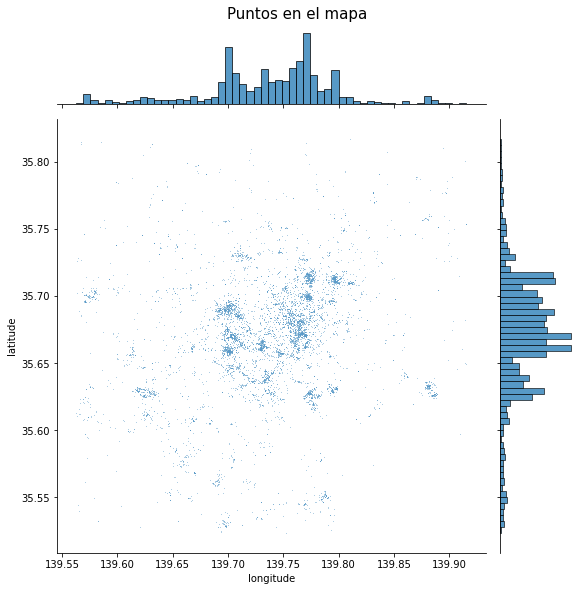

In [8]:
# Generate scatter plot
seaborn.jointplot(x='longitude', y='latitude', data=db, s=0.5, height=8);
plt.suptitle('Puntos en el mapa',y=1.02,fontsize=15);

Este es un buen comienzo: podemos ver que los puntos tienden a concentrarse en el centro del área cubierta de una manera muy (aparentemente) no aleatoria. Además, dentro del patrón amplio, también podemos ver que parece haber grupos más localizados. 

Sin embargo, el gráfico anterior tiene dos inconvenientes clave: uno, carece de contexto geográfico; y dos, hay áreas donde la densidad de puntos es tan grande que es difícil decir algo más allá de una aglomeración azul.

Empiece por el contexto. La forma más sencilla de proporcionar contexto adicional es superponer un mapa de mosaicos de Internet. Solicitemos contextily eso rápidamente e integremos con jointplot:

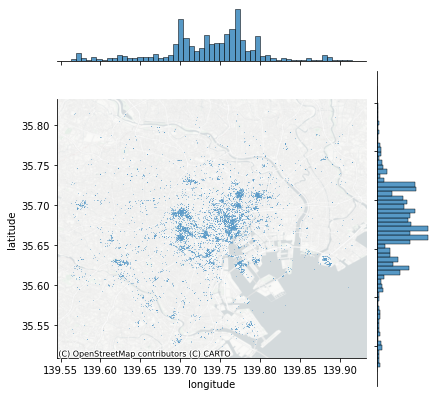

In [9]:
# Generate scatter plot
joint_axes = seaborn.jointplot(
    x='longitude', y='latitude', data=db, s=0.5
)
contextily.add_basemap(
    joint_axes.ax_joint,
    crs="EPSG:4326",
    source=contextily.providers.CartoDB.PositronNoLabels
);

In [10]:
db

,user_id,longitude,latitude,date_taken,photo/video_page_url,x,y
0,10727420@N00,139.700499,35.674000,2010-04-09 17:26:25.0,http://www.flickr.com/photos/10727420@N00/4545...,1.555139e+07,4.255856e+06
1,8819274@N04,139.766521,35.709095,2007-02-10 16:08:40.0,http://www.flickr.com/photos/8819274@N04/26503...,1.555874e+07,4.260667e+06
2,62068690@N00,139.765632,35.694482,2008-12-21 15:45:31.0,http://www.flickr.com/photos/62068690@N00/3125...,1.555864e+07,4.258664e+06
3,49503094041@N01,139.784391,35.548589,2011-11-11 05:48:54.0,http://www.flickr.com/photos/49503094041@N01/6...,1.556073e+07,4.238684e+06
4,40443199@N00,139.768753,35.671521,2006-04-06 16:42:49.0,http://www.flickr.com/photos/40443199@N00/2482...,1.555899e+07,4.255517e+06
...,...,...,...,...,...,...,...
9995,26981415@N00,139.582672,35.532785,2007-10-29 17:06:59.0,http://www.flickr.com/photos/26981415@N00/1797...,1.553827e+07,4.236522e+06
9996,36516818@N00,139.749461,35.696870,2006-08-26 13:59:06.0,http://www.flickr.com/photos/36516818@N00/2623...,1.555684e+07,4.258991e+06
9997,92996378@N00,139.770298,35.670336,2007-03-19 16:37:15.0,http://www.flickr.com/photos/92996378@N00/4321...,1.555916e+07,4.255354e+06
9998,95795770@N00,139.739075,35.642470,2008-08-13 17:12:36.0,http://www.flickr.com/photos/95795770@N00/2759...,1.555568e+07,4.251537e+06


In [11]:
import plotly.express as px
import numpy as np
fig = px.scatter_mapbox(db, lat ='latitude', lon='longitude')
fig.update_layout(mapbox_style="open-street-map")
fig.show()

### Agrupación hexadecimal 

Considere nuestro segundo problema: el desorden. Cuando se concentran demasiadas fotos en algunas áreas de, trazar puntos opacos uno encima del otro puede hacer que sea difícil discernir cualquier patrón y explorar su naturaleza. 

Ahora podemos reformular este enfoque como un histograma espacial o bidimensional.. Aquí, generamos una cuadrícula regular (ya sea cuadrada o hexagonal), contamos cuántos puntos caen dentro de cada celda de la cuadrícula y la presentamos como lo haríamos con cualquier otra coropleta. Esto es atractivo porque es simple, intuitivo y, si es lo suficientemente fino, la cuadrícula regular elimina algunas de las distorsiones de área que pueden inducir las coropletas. Para esta ilustración, usemos el agrupamiento hexagonal (a veces llamado hexbin) porque tiene propiedades ligeramente más agradables que las cuadrículas cuadradas, como menos distorsión de forma y conectividad más regular entre celdas. 

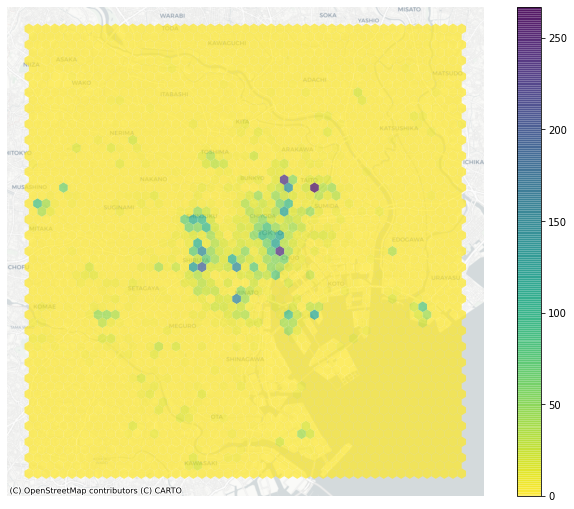

In [12]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 9))
# Generate and add hexbin with 50 hexagons in each 
# dimension, no borderlines, half transparency,
# and the reverse viridis colormap
hb = ax.hexbin(
    db['x'], 
    db['y'],
    gridsize=50, 
    linewidths=0,
    alpha=0.7, 
    cmap='viridis_r'
)
# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
# Add colorbar
plt.colorbar(hb)
# Remove axes
ax.set_axis_off()

In [13]:
import plotly.figure_factory as ff
import plotly.express as px

#px.set_mapbox_access_token(open(".mapbox_token").read())

fig = ff.create_hexbin_mapbox(
    data_frame=db, lat="latitude", lon="longitude",
    nx_hexagon=35, opacity=0.7, labels={"color": "Point Count"},
    min_count=1, color_continuous_scale="viridis_r" # color_continuous_scale="Viridis" #(del reves)
)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [14]:
import plotly.figure_factory as ff
import plotly.express as px

#px.set_mapbox_access_token(open(".mapbox_token").read())

fig = ff.create_hexbin_mapbox(
    data_frame=db, lat="latitude", lon="longitude",
    nx_hexagon=35, opacity=0.75, labels={"color": "Point Count"},
    min_count=1, color_continuous_scale="viridis_r", # color_continuous_scale="Viridis" #(del reves)
    show_original_data=True,
    original_data_marker=dict(opacity=0.5, size=3, color="red")
)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

### Estimación de densidad de kernel (KDE)

Las cuadrículas son el equivalente espacial de un histograma: el usuario decide cuántos "cubos" y los puntos se cuentan dentro de ellos de forma discreta. Esto es rápido, eficiente y potencialmente muy detallado (si se crean muchos bins). Sin embargo, representa una discretización de un fenómeno esencialmente contiguo y, como tal, puede introducir distorsiones (por ejemplo, MAUP). Un enfoque alternativo es, en cambio, crear lo que se conoce como estimación de densidad de kernel (KDE): una aproximación empírica de la función de densidad de probabilidad

En lugar de superponer una cuadrícula de cuadrados de hexágonos y contar cuántos puntos caen dentro de cada uno, un KDE coloca una cuadrícula de puntos sobre el espacio de interés en el que coloca las funciones del kernel que cuentan puntos a su alrededor con diferente peso según la distancia. Luego, estos conteos se agregan para generar una superficie global con probabilidad. La función del kernel más común es la gaussiana, que aplica una distribución normal a los puntos de peso. El resultado es una superficie continua con una función de probabilidad que puede evaluarse en cada punto. 

C:\Users\Julen Montes\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



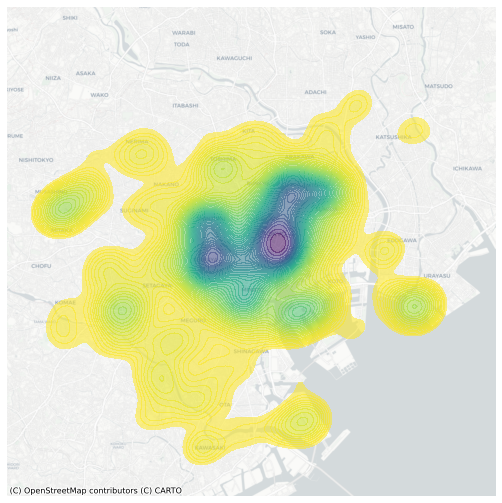

In [15]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Generate and add KDE with a shading of 50 gradients 
# coloured contours, 75% of transparency,
# and the reverse viridis colormap
seaborn.kdeplot(
    db['x'], 
    db['y'],
    n_levels=50, 
    shade=True,
    alpha=0.55, 
    cmap='viridis_r'
)
# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()

In [16]:
fig = px.density_mapbox(db, lat='latitude', lon='longitude', radius=4,
                        mapbox_style="open-street-map",
                        color_continuous_scale='viridis_r',
                        zoom=9.8
                       )
fig.show()

# Centrografía 

La centrografía es el análisis de la centralidad en un patrón de puntos. Por "centralidad", nos referimos a la ubicación general y la dispersión del patrón. Si el hexbin anterior puede verse como un "histograma espacial", la centrografía es el patrón de puntos equivalente a medidas de tendencia central como la media. Estas medidas son útiles porque **nos permiten resumir distribuciones espaciales en conjuntos de información más pequeños (por ejemplo, un solo punto)**. Se utilizan muchos índices diferentes en centrografía para proporcionar una indicación de "dónde" se encuentra un patrón de puntos, qué tan apretado se agrupa el patrón de puntos alrededor de su centro o qué tan irregular es su forma.

## Tendencia 

Una medida común de tendencia central para un patrón de puntos es su **centro de masa**. Para patrones de puntos marcados, el centro de masa identifica un punto central cercano a las observaciones que tienen valores más altos en su atributo marcado. Para patrones de puntos sin marcar, el centro de masa es equivalente al centro medio , o promedio de los valores de coordenadas. Además, el centro de la mediana es análogo a la mediana en otros lugares y representa un punto donde la mitad de los datos está por encima o por debajo del punto y la mitad está a su izquierda o derecha. Podemos analizar el centro medio con nuestro patrón de puntos de flickr usando el 'pointpats' paquete en Python.

In [17]:
from pointpats import centrography

In [18]:
mean_center = centrography.mean_center(db[['x', 'y']])
med_center = centrography.euclidean_median(db[['x', 'y']])

In [19]:
mean_center

array([15555485.40274061,  4255558.40964842])

In [20]:
med_center

array([15556148.27908865,  4255894.56283074])

Es más fácil visualizar esto trazando el patrón de puntos y su centro medio uno al lado del otro:

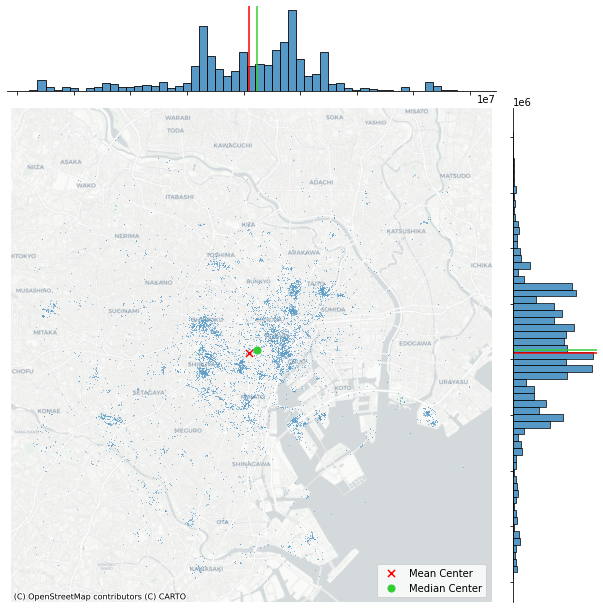

In [21]:
# Generate scatter plot
joint_axes = seaborn.jointplot(
    x='x', y='y', data=db, s=0.75, height=9
)
# Add mean point and marginal lines
joint_axes.ax_joint.scatter(
    *mean_center, color='red', marker='x', s=50, label='Mean Center'
)
joint_axes.ax_marg_x.axvline(mean_center[0], color='red')
joint_axes.ax_marg_y.axhline(mean_center[1], color='red')
# Add median point and marginal lines
joint_axes.ax_joint.scatter(
    *med_center, color='limegreen', marker='o', s=50, label='Median Center'
)
joint_axes.ax_marg_x.axvline(med_center[0], color='limegreen')
joint_axes.ax_marg_y.axhline(med_center[1], color='limegreen')
# Legend
joint_axes.ax_joint.legend()
# Add basemap
contextily.add_basemap(
    joint_axes.ax_joint, 
    source=contextily.providers.CartoDB.Positron
)
# Clean axes
joint_axes.ax_joint.set_axis_off()
# Display
plt.show()

La discrepancia entre los dos centros se debe al sesgo; Hay muchos "grupos" de imágenes en el oeste y el sur de Tokio, mientras que el norte y el este de Tokio está densamente lleno, pero desaparece muy rápidamente. Por lo tanto, los grupos de imágenes lejanos tiran del centro medio hacia el oeste y el sur, en relación con el centro medio.

## Dispersión 

Una medida de dispersión común en la centrografía es la **distancia estándar** (desbiación estándar) . Esta medida proporciona la distancia promedio desde el centro de la nube de puntos (tal como la mide el centro de masa). Esto también es simple de calcular usando pointpats, usando la 'std_distance' función:

In [22]:
centrography.std_distance(db[['x','y']])

8778.218564382098

Esto significa que, en promedio, las imágenes se toman a unos 8800 metros del centro medio.

Otra visualización útil es la elipse de desviación estándar o elipse estándar . Esta es una elipse extraída de los datos que refleja tanto su centro como su dispersión. Para visualizar esto, primero calculamos los ejes y la rotación usando la 'ellipse' función en 'pointpats':

In [23]:
major, minor, rotation = centrography.ellipse(db[['x','y']])
major, minor, rotation 

(7961.472887138463, 8785.957053230712, 1.180298293539531)

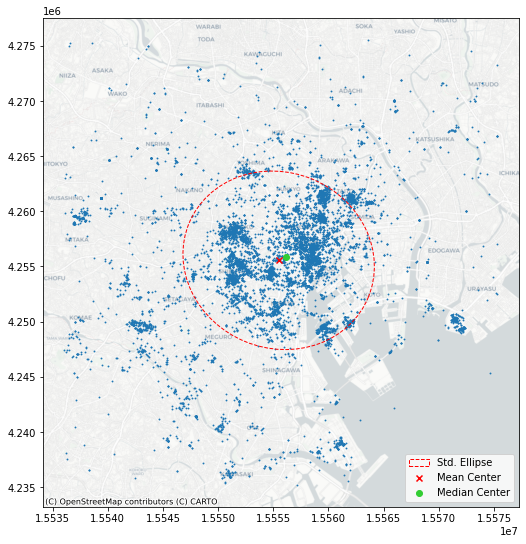

In [24]:
from matplotlib.patches import Ellipse

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot photograph points
ax.scatter(db['x'], db['y'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                  width=major*2, # centrography.ellipse only gives half the axis
                  height=minor*2, 
                  angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                  facecolor='none', 
                  edgecolor='red', linestyle='--',
                  label='Std. Ellipse')
ax.add_patch(ellipse)

ax.legend()
# Display
# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
plt.show()

## Extensión 

La última colección de medidas de centrografía que discutiremos caracteriza la extensión de una nube de puntos. Cuatro formas son útiles y reflejan diferentes niveles de cuán "firmemente" unen el patrón.

A continuación, explicaremos cómo construir cada ejemplo y visualizarlos al final. Para aclarar las cosas, usaremos las fotos de flickr para el usuario más prolífico en el conjunto de datos (ID:) 95795770 para mostrar cuán diferentes pueden ser estos resultados.

In [25]:
user = db.query('user_id == "95795770@N00"')
coordinates = user[['x','y']].values
coordinates

array([[15555055.38759244,  4250853.97298207],
       [15553355.09369007,  4251015.60061818],
       [15555108.48698955,  4251792.26839429],
       [15555068.52329236,  4250860.27367573],
       [15555885.83099376,  4254227.28052534],
       [15555054.05175856,  4250852.74023808],
       [15553793.69248379,  4251080.66326403],
       [15555713.28578303,  4251538.85221607],
       [15555337.35986262,  4251803.63801441],
       [15556433.18892999,  4251637.0674115 ],
       [15555055.83287041,  4251459.95194431],
       [15558490.70707832,  4254253.31317638],
       [15555208.67453127,  4251076.4170585 ],
       [15553736.02898757,  4250669.33687392],
       [15555645.26957416,  4250916.0212754 ],
       [15555079.54392195,  4251766.65254646],
       [15558412.78343477,  4262371.67217533],
       [15558474.00915471,  4254140.96217829],
       [15555079.65524144,  4250856.57544206],
       [15554992.93735811,  4250644.27152958],
       [15555188.30306445,  4251791.30951121],
       [15553

Primero, calcularemos el **casco convexo** , que es la **forma convexa más apretada que encierra las fotos del usuario**. Con convexo , queremos decir que la forma nunca se "dobla" sobre sí misma; no tiene vellones, valles, almenas ni huecos. Todos sus ángulos interiores son menores de 180 grados. Esto se calcula utilizando el centrography.hull método.

In [26]:
convex_hull_vertices = centrography.hull(coordinates)
convex_hull_vertices

array([[15537916.97274838,  4259950.19947175],
       [15550888.47641307,  4236478.38098534],
       [15561070.53627746,  4239555.81249334],
       [15572223.74737953,  4250125.30852468],
       [15571247.92072323,  4267392.63935002],
       [15571136.60123244,  4267407.72904653],
       [15539499.60194899,  4262787.14125788]])

En segundo lugar, calcularemos la **forma alfa**, que puede entenderse como una versión "más ajustada" del casco convexo. Una forma de pensar en un casco convexo es que es el espacio que queda cuando se hace rodar una bola o un círculo realmente grande alrededor de la forma. La bola es tan grande en relación con la forma, su radio es realmente infinito y las líneas que forman el casco convexo son en realidad solo líneas rectas.

Por el contrario, puede pensar en una forma alfa como el espacio formado por hacer rodar pequeñas bolas alrededor de la forma. Dado que la bola es más pequeña, rueda hacia los huecos y valles creados entre los puntos. A medida que esa bola se hace más grande, la forma alfa se convierte en el casco convexo. Pero, para las bolas pequeñas, la forma puede volverse muy ajustada. De hecho, si alfa se vuelve demasiado pequeño, se “desliza” a través de las puntas, ¡resultando en más de un casco! Como tal, el pysalpaquete tiene una alpha_shape_autofunción para encontrar la más pequeña sola forma alfa, de modo que usted no tiene que adivinar lo grande que la pelota tiene que ser.

In [38]:
import libpysal
alpha_shape, alpha, circs = libpysal.cg.alpha_shape_auto(coordinates, return_circles=True)
alpha_shape, alpha, circs

KeyError: 0

A modo de ilustración, la siguiente figura tiene la forma alfa única más ajustada que se muestra en verde y los puntos de origen originales se muestran en negro. Los círculos "delimitadores" que se muestran en la figura tienen un radio de 8652 metros. Los círculos se trazan donde nuestro disco "delimitador" toca dos o tres de los puntos en la nube de puntos. Puede ver que los círculos “cortan” el casco convexo, que se muestra en líneas discontinuas azules, hasta que tocan dos (o tres) puntos. Un poco más apretado, y el círculo desconectaría uno de los puntos en el límite de la forma alfa.

NameError: name 'alpha_shape' is not defined

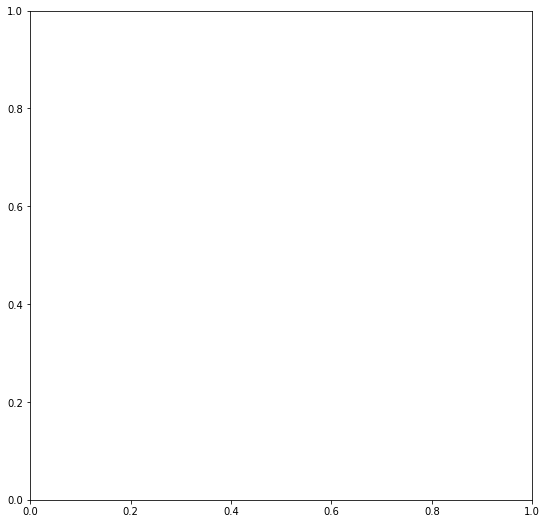

In [27]:
from descartes import PolygonPatch #to plot the alpha shape easily
f,ax = plt.subplots(1,1, figsize=(9,9))

# Plot a green alpha shape
ax.add_patch(
    PolygonPatch(
        alpha_shape, 
        edgecolor='green', 
        facecolor='green', 
        alpha=.2, 
        label = 'Tighest single alpha shape'
    )
)

# Include the points for our prolific user in black
ax.scatter(
    *coordinates.T, color='k', marker='.', label='Source Points'
)

# plot the circles forming the boundary of the alpha shape
for i, circle in enumerate(circs):
    # only label the first circle of its kind
    if i == 0:
        label = 'Bounding Circles'
    else:
        label = None
    ax.add_patch(
        plt.Circle(
            circle, 
            radius=alpha, 
            facecolor='none', 
            edgecolor='r', 
            label=label
        )
    )

# add a blue convex hull
ax.add_patch(
    plt.Polygon(
        convex_hull_vertices, 
        closed=True, 
        edgecolor='blue', 
        facecolor='none', 
        linestyle=':', 
        linewidth=2,
        label='Convex Hull'
    )
)

# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)

plt.legend();

Cubriremos tres formas más delimitadoras, todas ellas rectángulos o círculos. Primero, dos tipos de rectángulos delimitadores mínimos . Ambos están construidos como el rectángulo más estrecho que se puede dibujar alrededor de los datos que contienen todos los puntos. Se puede dibujar un tipo de rectángulo delimitador mínimo simplemente considerando líneas verticales y horizontales. Sin embargo, a menudo se pueden dibujar líneas diagonales para construir un rectángulo con un área más pequeña. Esto significa que el **rectángulo girado mínimo** proporciona un **límite rectangular más estrecho en el patrón de puntos**, pero el rectángulo está torcido o girado.

Para el **rectángulo girado mínimo**, usaremos la minimum_rotated_rectangle función del pointpats.centrography módulo.

In [39]:
min_rot_rect = centrography.minimum_rotated_rectangle(coordinates)
min_rot_rect

array([[15537544.,  4262501.],
       [15541544.,  4235113.],
       [15575244.,  4240035.],
       [15571244.,  4267423.]], dtype=float32)

Y, para el **rectángulo delimitador mínimo sin rotación**, usaremos la minimum_bounding_rectangle función del pointpat spaquete.

In [40]:
min_rect_vertices = centrography.minimum_bounding_rectangle(coordinates)
min_rect_vertices

(15537916.972748384, 4236478.38098534, 15572223.747379526, 4267407.729046531)

Finalmente, el **círculo delimitador mínimo** es el **círculo más pequeño que se puede dibujar para encerrar el conjunto de datos completo**. A menudo, este círculo es más grande que el rectángulo delimitador mínimo. Está implementado en la minimum_bounding_circle función en pointpats.

In [41]:
(center_x, center_y), radius = centrography.minimum_bounding_circle(coordinates)
(center_x, center_y), radius

((15556536.555133801, 4254919.949936765), 19287.100835162568)

Ahora, para visualizarlos, convertiremos los vértices sin procesar en parches matplotlib:



In [42]:
from matplotlib.patches import Polygon, Circle, Rectangle
from descartes import PolygonPatch

# Make a purple alpha shape
alpha_shape_patch = PolygonPatch(
    alpha_shape, 
    edgecolor='purple', 
    facecolor='none', 
    linewidth=2,
    label='Alpha Shape'
)

# a blue convex hull
convex_hull_patch = Polygon(
    convex_hull_vertices, 
    closed=True, 
    edgecolor='blue', facecolor='none', 
    linestyle=':', linewidth=2,
    label='Convex Hull'
)

# a green minimum rotated rectangle
"""
# Commented out until functionality is added to pointpats
min_rot_rect_patch = Polygon(
    min_rot_rect, 
    closed=True, 
    edgecolor='green', 
    facecolor='none', 
    linestyle='--', 
    label='Min Rotated Rectangle', 
    linewidth=2
)
"""

# compute the width and height of the 
min_rect_width = min_rect_vertices[2] - min_rect_vertices[0]
min_rect_height = min_rect_vertices[2] - min_rect_vertices[0]

# a goldenrod minimum bounding rectangle
min_rect_patch = Rectangle(
    min_rect_vertices[0:2], 
    width = min_rect_width,
    height = min_rect_height,
    edgecolor='goldenrod', facecolor='none', 
    linestyle='dashed', linewidth=2, 
    label='Min Bounding Rectangle', 
)

# and a red minimum bounding circle
circ_patch = Circle(
    (center_x, center_y), 
    radius=radius,
    edgecolor='red', 
    facecolor='none', 
    linewidth=2,
    label='Min Bounding Circle'
)

NameError: name 'alpha_shape' is not defined

Finalmente, trazaremos los parches junto con las ubicaciones de las fotografías a continuación:

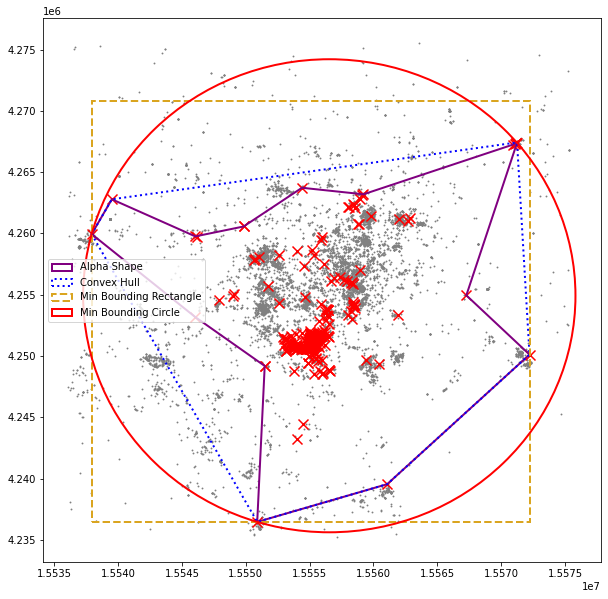

In [45]:
f,ax = plt.subplots(1, figsize=(10,10))

ax.add_patch(alpha_shape_patch)
ax.add_patch(convex_hull_patch)
# Commented out until functionality is added to pointpats
#ax.add_patch(min_rot_rect_patch)
ax.add_patch(min_rect_patch)
ax.add_patch(circ_patch)

ax.scatter(db.x, db.y, s=.75, color='grey')
ax.scatter(user.x, user.y, s=100, color='r', marker='x')
ax.legend(ncol=1, loc='center left')

# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
plt.show()

Cada uno da una impresión diferente del área que encierra la gama de fotografías del usuario. En esto, puede ver que **la forma alfa es mucho más ajustada que el resto de las formas**. El **rectángulo y el círculo delimitadores mínimos son las formas "más sueltas"**, ya que contienen la mayor parte del área fuera del área típica del usuario. Pero también son las formas más simples de dibujar y comprender.

## Aleatoriedad y agrupamiento

Más allá de las cuestiones de centralidad y extensión, las estadísticas espaciales sobre patrones de puntos a menudo se preocupan por cuán uniforme es una distribución de puntos. Con esto, **queremos decir si los puntos tienden a agruparse todos cerca unos de otros o se dispersan uniformemente por toda el área del problema**. Preguntas como esta se refieren a la **intensidad o dispersión del patrón de puntos** en general. En la jerga de los dos últimos capítulos, este enfoque se asemeja a los objetivos que examinamos cuando introdujimos la autocorrelación espacial global : ¿cuál es el grado general de agrupamiento?observamos en el patrón? La estadística espacial ha dedicado un gran esfuerzo a comprender este tipo de agrupación. Esta sección cubrirá métodos útiles para identificar agrupaciones en patrones de puntos.

El primer conjunto de técnicas, las **estadísticas de cuadrantes**, reciben su nombre después de su enfoque para dividir los datos en áreas pequeñas (cuadrantes). Una vez creados, estos "cubos" se utilizan para examinar la uniformidad de los recuentos entre ellos. El segundo conjunto de técnicas se derivan de **Ripley (1988)** e implican **mediciones de la distancia** entre puntos en un patrón de puntos.

In [43]:
from pointpats import distance_statistics, QStatistic, random, PointPattern

Con fines ilustrativos, también ayuda a proporcionar un patrón derivado de un proceso conocido completamente **aleatorio** espacialmente. Es decir, la ubicación y el número de puntos es totalmente aleatorio; no hay agrupamiento ni dispersión. En el análisis de patrones de puntos, esto se conoce como **proceso de puntos de Poisson.**

Para simular estos procesos a partir de un conjunto de puntos dado, puede utilizar el pointpats.random módulo.

In [44]:
random_pattern = random.poisson(coordinates, size=len(coordinates))
random_pattern

array([[15557728.70106657,  4246639.89187378],
       [15555714.25723254,  4242472.8694223 ],
       [15567538.50951794,  4243366.9427606 ],
       [15544955.66615558,  4250664.2249261 ],
       [15538943.71465288,  4237493.29815921],
       [15551277.13450644,  4255461.25530336],
       [15552343.12436694,  4243086.35244348],
       [15559855.78508445,  4238837.80391241],
       [15543281.01143404,  4259309.54224325],
       [15571949.13104546,  4259438.59192422],
       [15566894.8519005 ,  4247663.00831934],
       [15571454.8030793 ,  4237209.29720319],
       [15539685.9240652 ,  4255759.23303969],
       [15567638.99047112,  4261856.00344404],
       [15539469.50366693,  4256697.2423672 ],
       [15570193.00468379,  4241890.09958154],
       [15541234.10916649,  4250263.80825449],
       [15554256.77749416,  4267389.02316235],
       [15546297.34135678,  4258774.82639675],
       [15571075.82603247,  4243753.54909915],
       [15561680.17133766,  4261456.61442048],
       [15548

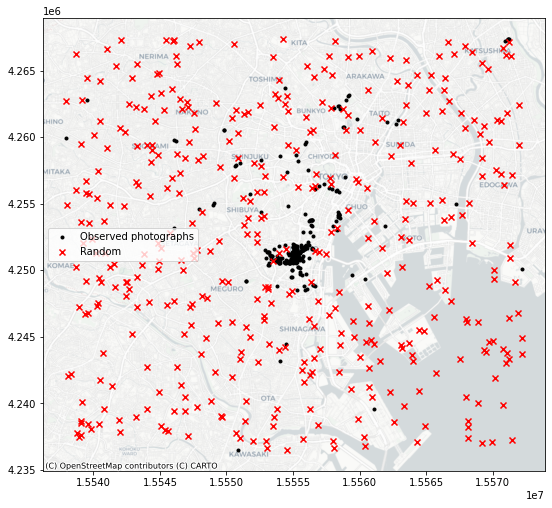

In [46]:
f,ax = plt.subplots(1, figsize=(9, 9))
plt.scatter(*coordinates.T, color='k', marker='.', label='Observed photographs')
plt.scatter(*random_pattern.T, color='r', marker='x', label='Random')
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
ax.legend(ncol=1, loc='center left')
plt.show()

Como puede ver, la simulación (por defecto) funciona con el cuadro delimitador del patrón de puntos de entrada. Para simular desde áreas más restringidas formadas por el patrón de puntos, ¡pase esos cascos al simulador! Por ejemplo, para generar un patrón aleatorio dentro de las formas alfa:

In [48]:
random_pattern_ashape = random.poisson(alpha_shape, size=len(coordinates))

NameError: name 'alpha_shape' is not defined

NameError: name 'random_pattern_ashape' is not defined

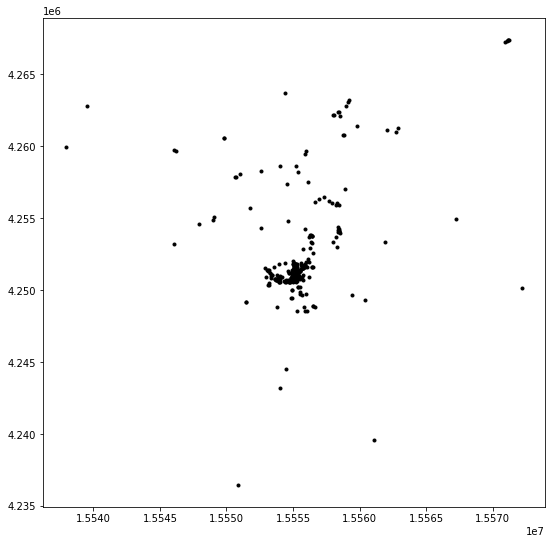

In [49]:
f,ax = plt.subplots(1, figsize=(9, 9))
plt.scatter(*coordinates.T, color='k', marker='.', label='Observed')
plt.scatter(*random_pattern_ashape.T, color='r', marker='x', label='Random')
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
ax.legend(ncol=1, loc='center left')
plt.show()

### Estadísticas de Quadrat

Las estadísticas de Quadrat examinan la distribución espacial de puntos en un área en términos del recuento de observaciones que se encuentran dentro de una celda determinada. Al **examinar si las observaciones se distribuyen de manera uniforme** en las celdas, el enfoque de cuadrante tiene como objetivo estimar si los puntos están dispersos o si están agrupados en unas pocas celdas. **Estrictamente hablando, las estadísticas cuadráticas examinan la uniformidad de la distribución en las celdas usando un χ2 prueba estadística** común en el análisis de tablas de contingencia.

En el pointpats paquete, puede visualizar los resultados utilizando el siguiente QStatistic.plot() método. Esto muestra la cuadrícula utilizada para contar los eventos, así como el patrón subyacente:

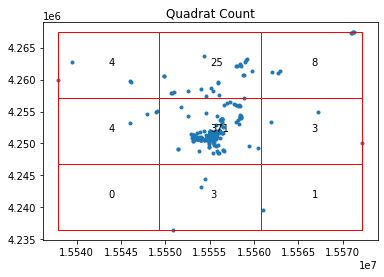

In [50]:
qstat = QStatistic(coordinates)
qstat.plot()

En este caso, para el valor predeterminado de una cuadrícula de tres por tres que abarca el patrón de puntos, vemos que el cuadrado central tiene más de 350 observaciones, pero las celdas circundantes tienen muchas menos fotografías de flickr. Esto significa que la prueba de chi-cuadrado (que compara la probabilidad de esta distribución si los recuentos de células son uniformes) será estadísticamente significativa, con un valor p muy pequeño:

In [51]:
qstat.chi2_pvalue

0.0

Por el contrario, nuestro proceso de puntos totalmente aleatorio tendrá casi los mismos puntos en cada celda:


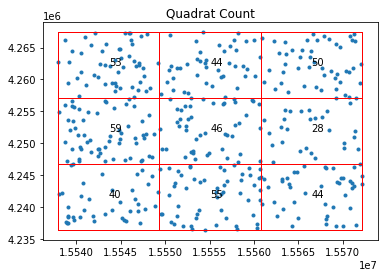

In [52]:
qstat_null = QStatistic(random_pattern)
qstat_null.plot()

Esto significa que su valor p será grande y probablemente no significativo:

In [53]:
qstat_null.chi2_pvalue

0.06716600946657131

Sin embargo, tenga cuidado: el hecho de que los recuentos de cuadrantes se midan en un mosaico regular que se superpone sobre la extensión potencialmente irregular de nuestro patrón puede engañarnos. En particular, los patrones irregulares pero aleatorios se pueden considerar erróneamente "significativos" mediante este enfoque. Considere nuestro conjunto aleatorio generado dentro del polígono de forma alfa, con la cuadrícula de cuadrícula superpuesta en la parte superior:

In [54]:
qstat_null_ashape = QStatistic(random_pattern_ashape)
qstat_null_ashape.plot()

NameError: name 'random_pattern_ashape' is not defined

La prueba del cuadrante encuentra que esto es estadísticamente no aleatorio , mientras que nuestro proceso de simulación aseguró que dentro del área de estudio dada , el patrón es un proceso completo espacialmente aleatorio.

In [56]:
qstat_null_ashape.chi2_pvalue, round(qstat_null_ashape.chi2_pvalue)

NameError: name 'qstat_null_ashape' is not defined

Por lo tanto, los recuentos de cuadrantes pueden tener problemas con las áreas de estudio irregulares, y se debe tener cuidado para garantizar que la agrupación no se identifique por error. Una forma de interpretar la estadística cuadrática que reconcilia casos como el anterior es pensar en ella como una prueba que considera tanto la uniformidad de los puntos como la forma de su extensión para examinar si el patrón resultante es uniforme en una cuadrícula regular. En algunos casos, esta es una herramienta útil; en otros, esto debe usarse con precaución.

### Alfabeto de funciones de Ripley

El segundo grupo de estadísticas espaciales que consideramos se centra en las distribuciones de dos cantidades en un patrón de puntos: las **distancias de los vecinos más cercanos y lo que llamaremos "huecos" en el patrón**. Se derivan del trabajo fundamental de [ Rip91 ] sobre cómo caracterizar el agrupamiento o la coubicación en patrones de puntos. Cada uno de estos caracteriza un aspecto del patrón de puntos a medida que aumentamos el rango de distancia desde cada punto para calcularlos.

La primera función, Ripley's G, se centra en la distribución de las distancias de los vecinos más cercanos. Eso es el G La función resume las distancias entre cada punto del patrón y su vecino más cercano. En la siguiente gráfica, esta lógica de vecino más cercano se visualiza con los puntos rojos como una vista detallada del patrón de puntos y las flechas negras indican el vecino más cercano a cada punto. Tenga en cuenta que a veces dos puntos son vecinos más cercanos mutuos (y por lo tanto tienen flechas en ambas direcciones), pero algunos no lo son.




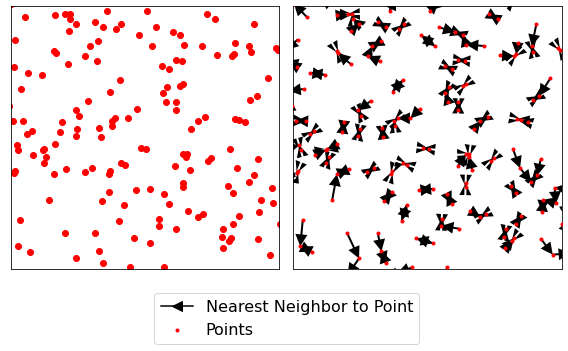

In [57]:
# this code should be hidden in the book, and only the plot visible!
f,ax = plt.subplots(1,2,figsize=(8,4), sharex=True, sharey=True)
ax[0].scatter(*random_pattern.T, color='red')
ax[1].scatter(*random_pattern.T, color='red',
              zorder=100, marker='.', label='Points')
nn_ixs, nn_ds = PointPattern(random_pattern).knn(1)
first = True
for coord, nn_ix, nn_d in zip(random_pattern, nn_ixs, nn_ds):
    dx, dy = random_pattern[nn_ix].squeeze() - coord
    arrow = ax[1].arrow(*coord, dx,dy, 
                length_includes_head=True, 
                overhang=0, head_length=300*3,
                head_width=300*3, width=50*3,
                linewidth=0, facecolor='k',
                head_starts_at_zero=False)
    if first:
        plt.plot((1e100, 1e101), (0,1), color='k', 
                 marker='<', markersize=10,
                 label='Nearest Neighbor to Point')
    first = False

ax[0].axis([1.554e7, 1.556e7, 4240000, 4260000])
ax[0].set_xticklabels([])
ax[0].set_yticklabels([])
ax[0].set_xticks([])
ax[0].set_yticks([])
f.tight_layout()
ax[1].legend(bbox_to_anchor = (.5,-.06), fontsize=16)
plt.show()

De Ripley G realiza un seguimiento de la proporción de puntos para los que el vecino más cercano se encuentra dentro de un umbral de distancia determinado y traza ese porcentaje acumulativo frente a los radios de distancia crecientes. La distribución de estos porcentajes acumulados tiene una forma distintiva en procesos completamente aleatorios en el espacio. La intuición detrás de la G de Ripley es la siguiente: 

podemos aprender qué tan similar es nuestro patrón a uno espacialmente aleatorio calculando la distribución acumulativa de distancias vecinas más cercanas sobre umbrales de distancia crecientes, y comparándola con la de un conjunto de patrones simulados que siguen un proceso espacialmente aleatorio conocido. Por lo general, se utiliza un proceso espacial de puntos de Poisson como distribución de referencia.

Para hacer esto en el pointpats paquete, podemos usar la g_test función, que calcula tanto la G función para los datos empíricos como estas réplicas hipotéticas bajo un proceso completamente espacialmente aleatorio.

In [58]:
g_test = distance_statistics.g_test(
    coordinates, support=40, keep_simulations=True
)

Pensando en estas distribuciones de distancias, un patrón "agrupado" debe tener más puntos cerca uno del otro que un patrón que está "disperso"; y un patrón completamente aleatorio debería tener algo intermedio. Por tanto, si elGLa función aumenta rápidamente con la distancia, probablemente tengamos un patrón agrupado. Si aumenta lentamente con la distancia, tenemos un patrón disperso. Algo en el medio será difícil de distinguir del azar puro.

Podemos visualizar esto a continuación. A la izquierda, trazamos elG(d) función, con distancia al punto (d) en el eje horizontal y la fracción de distancias vecinas más cercanas menores que den el eje derecho. En rojo, se muestra la distribución acumulativa empírica de las distancias de los vecinos más cercanos. En azul, se randommuestran las simulaciones (como el patrón que se muestra en la sección anterior). La línea azul brillante representa el promedio de todas las simulaciones, y la banda azul / negra más oscura a su alrededor representa el 95% medio de las simulaciones.

En esta gráfica, vemos que la función empírica roja aumenta mucho más rápido que los patrones simulados completamente aleatorios en el espacio. Esto significa que el patrón observado de las fotografías de flickr de este usuario está más cerca de sus vecinos más cercanos de lo que se esperaría de un patrón completamente espacialmente aleatorio. El patrón está agrupado.

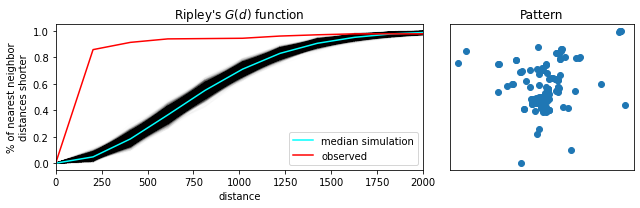

In [59]:
f,ax = plt.subplots(1,2,figsize=(9,3), 
                    gridspec_kw=dict(width_ratios=(6,3)))
# plot all the simulations with very fine lines
ax[0].plot(g_test.support, g_test.simulations.T, color='k', alpha=.01)
# and show the average of simulations
ax[0].plot(g_test.support, numpy.median(g_test.simulations, axis=0), color='cyan', 
         label='median simulation')


# and the observed pattern's G function
ax[0].plot(g_test.support, g_test.statistic, label = 'observed', color='red')

# clean up labels and axes
ax[0].set_xlabel('distance')
ax[0].set_ylabel('% of nearest neighbor\ndistances shorter')
ax[0].legend()
ax[0].set_xlim(0,2000)
ax[0].set_title(r"Ripley's $G(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title('Pattern')
f.tight_layout()
plt.show()

La segunda función que presentamos es la de Ripley F. Donde el G La función funciona analizando la distancia entre puntos en el patrón, la función F funciona analizando la distancia a los puntos en el patrón desde ubicaciones en un espacio vacío. Es por eso que elFLa función se denomina “función de espacio vacío”, ya que caracteriza la distancia típica desde puntos arbitrarios en el espacio vacío hasta el patrón de puntos. Más explícitamente, elFacumula, para un rango de distancia creciente, el porcentaje de puntos que se pueden encontrar dentro de ese rango a partir de un patrón de puntos aleatorio generado dentro de la extensión del patrón observado. Si el patrón tiene grandes espacios o áreas vacías, elFLa función aumentará lentamente. Pero, si el patrón está muy disperso, entonces elFLa función aumentará rápidamente. La forma de esta distribución acumulativa se compara luego con las construidas calculando la misma distribución acumulativa entre el patrón aleatorio y uno adicional aleatorio generado en cada paso de la simulación.

Podemos utilizar herramientas similares para investigar el F función, ya que es tan matemáticamente similar a la Gfunción. Esto se implementa de manera idéntica usando la f_testfunción en pointpats. Desde elFLa función estimada para el patrón observado aumenta mucho más lentamente que laFfunciones para los patrones simulados, podemos estar seguros de que hay muchas lagunas en nuestro patrón; es decir, el patrón está agrupado .

In [60]:
f_test = distance_statistics.f_test(
    coordinates, support=40, keep_simulations=True
)

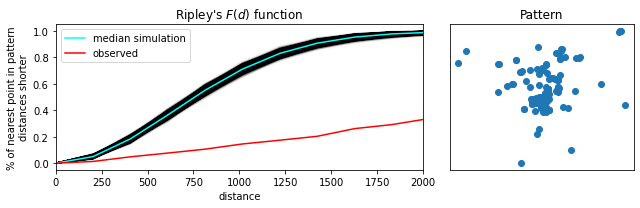

In [61]:
f,ax = plt.subplots(
    1,2,figsize=(9,3), gridspec_kw=dict(width_ratios=(6,3))
)

# plot all the simulations with very fine lines
ax[0].plot(f_test.support, f_test.simulations.T, color='k', alpha=.01)
# and show the average of simulations
ax[0].plot(f_test.support, numpy.median(f_test.simulations, axis=0), color='cyan', 
         label='median simulation')


# and the observed pattern's F function
ax[0].plot(f_test.support, f_test.statistic, label = 'observed', color='red')

# clean up labels and axes
ax[0].set_xlabel('distance')
ax[0].set_ylabel('% of nearest point in pattern\ndistances shorter')
ax[0].legend()
ax[0].set_xlim(0,2000)
ax[0].set_title(r"Ripley's $F(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title('Pattern')
f.tight_layout()
plt.show()

El “alfabeto” de Ripley se extiende a varias otras funciones con nombres de letras que se pueden usar para realizar análisis de patrones de puntos en esta línea. Los buenos "siguientes pasos" en su viaje de análisis de patrones de puntos incluyen el libro de [ BRT15 ] ; y la pointpatsdocumentación para obtener orientación sobre cómo ejecutarlos en Python.

### Identificación de clústeres 

Las dos secciones anteriores sobre el análisis espacial exploratorio de patrones de puntos proporcionan métodos para caracterizar si los patrones de puntos están dispersos o agrupados en el espacio. Otra forma de ver el contenido de esas secciones es que nos ayudan a explorar el grado de agrupación general. Sin embargo, saber que un patrón de puntos está agrupado no necesariamente nos da información sobre dónde reside ese (conjunto de) grupos. Para hacer esto, necesitamos cambiar a un método capaz de **identificar áreas de alta densidad de puntos dentro de nuestro patrón**. En otras palabras, en esta sección nos enfocamos en la existencia y ubicación de los **clusters**. Esta distinción entre grupo ING y el grupo sde puntos es análogo a lo discutido en el contexto de la autocorrelación espacial (Capítulos 6 y 7). La noción es la misma, las diferencias en las técnicas que examinamos en cada parte del libro se relacionan con la naturaleza única de los puntos a los que nos referimos en el al comienzo del libro. Recuerde que, si bien los métodos que exploramos en los capítulos anteriores toman la ubicación de los objetos espaciales (puntos, líneas, polígonos) como se indica y se enfocan en comprender las configuraciones de valores dentro de esas ubicaciones; los métodos discutidos en este El capítulo entiende los puntos como eventos que suceden en ubicaciones particulares pero que podrían ocurrir en un conjunto mucho más amplio de lugares. Tener en cuenta esta relevancia subyacente de la ubicación de un objeto en sí es lo que hace que las técnicas de este capítulo sean distintas.

De los muchos algoritmos de agrupamiento de puntos espaciales, cubriremos uno llamado **DBSCAN** (agrupamiento espacial de aplicaciones **basado en densidad**, [ EKS + 96 ] . DBSCAN es un algoritmo ampliamente utilizado que se originó en el área de descubrimiento de conocimiento y aprendizaje automático y que desde entonces se extendió a muchas áreas, incluido el análisis de puntos espaciales. En parte, su popularidad reside en su simplicidad intelectual y manejabilidad computacional. De alguna manera, podemos pensar en DBSCAN como una contraparte de patrón de puntos de las estadísticas locales que exploramos en el Capítulo 7. Sin embargo, difieren en formas fundamentales. A diferencia de las estadísticas locales que hemos visto anteriormente, DBSCAN no se basa en un marco inferencial, sino que es un algoritmo determinista. Esto implica que, a diferencia de las medidas vistas anteriormente, no podremos estimar una medida del grado en que los conglomerados encontrados son compatibles con casos de aleatoriedad espacial.

Desde el punto de vista de DBSCAN, **un grupo es una concentración de al menos m puntos**, cada uno de ellos **a una distancia r de al menos otro punto del grupo**. Siguiendo esta definición, el algoritmo clasifica cada punto de nuestro patrón en tres categorías:

**- Ruido** , para aquellos puntos fuera de un grupo.

**- Núcleos** , para aquellos puntos dentro de un grupo con al menos mp untos en el grupo dentro de la distancia r.

**- Bordes** para puntos dentro de un grupo con menos que m otros puntos en el grupo dentro de la distancia r.

La flexibilidad (pero también algunas de las limitaciones) de reside el algoritmo en el que tanto **m y r necesidad de ser preespecificados por el usuario antes de ejecutar DBSCAN**. Este es un punto crítico, ya que su valor puede influir significativamente en el resultado final. Antes de explorar esto con mayor profundidad, veamos por primera vez la informática DBSCAN en Python:

In [62]:
# Define DBSCAN
clusterer = DBSCAN()
# Fit to our data
clusterer.fit(db[["x", "y"]])

DBSCAN()

Siguiendo la interfaz estándar en scikit-learn, primero definimos el algoritmo que queremos ejecutar (creando el clusterer objeto) y luego lo ajustamos a nuestros datos. Una vez ajustada, clusterer contiene la información necesaria para acceder a todos los resultados del algoritmo. El core_sample_indices_atributo contiene los índices (orden, comenzando desde cero) de cada punto que se clasifica como núcleo  Podemos echarle un vistazo para ver cómo se ve:

In [63]:
# Print the first 5 elements of `cs`
clusterer.core_sample_indices_[:5]

array([ 1, 22, 30, 36, 42], dtype=int64)

La impresión de arriba nos dice que el segundo punto (recuerde, Python comienza a contar desde cero) en el conjunto de datos es un núcleo, ya que es el 23, 31, 36 y 43. Este atributo tiene una longitud variable, dependiendo de cuántos núcleos encuentre el algoritmo.

El segundo atributo de interés es labels_:

In [64]:
clusterer.labels_[:5]

array([-1,  0, -1, -1, -1], dtype=int64)

El objeto de etiquetas siempre tiene la misma longitud que el número de puntos utilizados para ejecutar DBSCAN. Cada valor representa el índice del clúster al que pertenece un punto. Si el punto se clasifica como ruido , recibe un -1. Arriba, podemos ver que el segundo punto pertenece al grupo 1, mientras que los otros en la lista no forman parte de ningún grupo. Para facilitar las ideas más adelante, convierta las etiquetas en un Seriesobjeto que podamos indexar de la misma manera que nuestra colección de puntos:

In [65]:
lbls = pandas.Series(clusterer.labels_, index=db.index)
lbls

0        -1
1         0
2        -1
3        -1
4        -1
       ... 
9995     -1
9996     -1
9997    146
9998     -1
9999     -1
Length: 10000, dtype: int64

Ahora que ya tenemos los clusters, podemos proceder a visualizarlos. Hay muchas formas de hacerlo. Comenzaremos simplemente coloreando los puntos en un grupo en rojo y el ruido en gris:

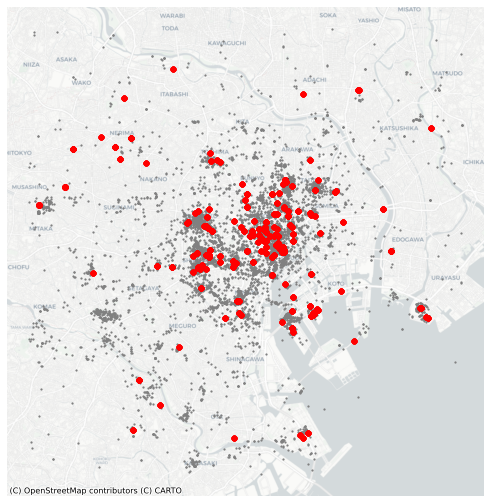

In [66]:
# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Subset points that are not part of any cluster (noise)
noise = db.loc[lbls==-1, ['x', 'y']]
# Plot noise in grey
ax.scatter(noise['x'], noise['y'], c='grey', s=5, linewidth=0)
# Plot all points that are not noise in red
# NOTE how this is done through some fancy indexing, where
#      we take the index of all points (tw) and substract from
#      it the index of those that are noise
ax.scatter(db.loc[db.index.difference(noise.index), 'x'], \
           db.loc[db.index.difference(noise.index), 'y'], \
          c='red', linewidth=0)
# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()
# Display the figure
plt.show()

Aunque informativo, el resultado de esta ejecución no es particularmente satisfactorio. Hay manera demasiados puntos que se clasifican como “ruido”.

Esto se debe a que hemos ejecutado DBSCAN con los parámetros predeterminados: un radio de 0.5 y un mínimo de cinco puntos por grupo. Dado que nuestros datos se expresan en metros, un radio de medio metro solo detectará cúmulos hiperlocales. Esto puede ser de interés en algunos casos pero, en otros, puede resultar en resultados extraños.

Si cambiamos esos parámetros, podemos recoger patrones más generales. Por ejemplo, digamos que un clúster necesita, al menos, tener aproximadamente el 1% de todos los puntos en el conjunto de datos:

In [68]:
# Obtain the number of points 1% of the total represents
minp = numpy.round(db.shape[0] * 0.01)
minp

100.0

Al mismo tiempo, ampliemos el radio máximo para decir 500 metros. Luego, podemos volver a ejecutar el algoritmo y trazar la salida, todo en la misma celda esta vez:

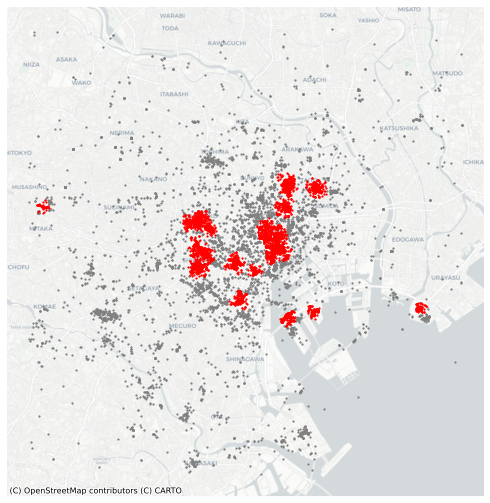

In [69]:
# Rerun DBSCAN
clusterer = DBSCAN(eps=500, min_samples=minp)
clusterer.fit(db[['x', 'y']])
# Turn labels into a Series
lbls = pandas.Series(clusterer.labels_, index=db.index)
# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Subset points that are not part of any cluster (noise)
noise = db.loc[lbls==-1, ['x', 'y']]
# Plot noise in grey
ax.scatter(noise['x'], noise['y'], c='grey', s=5, linewidth=0)
# Plot all points that are not noise in red
# NOTE how this is done through some fancy indexing, where
#      we take the index of all points (db) and substract from
#      it the index of those that are noise
ax.scatter(
    db.loc[db.index.difference(noise.index), 'x'],
    db.loc[db.index.difference(noise.index), 'y'],
    c='red', 
    linewidth=0,
    s=5
)
# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()
# Display the figure
plt.show()

## Conclusión 

En general, este capítulo ha proporcionado una descripción general de los métodos para analizar patrones de puntos. 

Hemos comenzado nuestro viaje de puntos visualizando su ubicación y aprendiendo la forma de superar el desafío de "desorden" que nos presentan los patrones de puntos grandes.

De la visualización gráfica, hemos pasado a la caracterización estadística de su distribución espacial. 

En este contexto, hemos aprendido acerca de la dispersión y extensión de la tendencia central, y hemos posicionado estas medidas como las contrapartes de patrones puntuales de las estadísticas tradicionales, como la media o la desviación estándar. Estas medidas proporcionan un resumen de un patrón completo, pero nos dicen poco sobre la organización espacial de cada punto. Con ese fin, hemos introducido el cuadrante y las funciones de Ripley. Estos dispositivos estadísticos nos ayudan a caracterizar si un patrón de puntos está agrupado o disperso espacialmente.

Hemos concluido el capítulo yendo un paso más allá y explorando métodos para identificar la ubicación de los conglomerados: áreas del mapa con alta densidad de puntos. En conjunto, el análisis de patrones de puntos tiene muchas aplicaciones en los campos estadísticos clásicos, así como en la ciencia de datos. Usando las técnicas discutidas aquí, debería ser capaz de responder preguntas fundamentales sobre patrones de puntos que representan fenómenos muy variados en el mundo, desde el lugar donde se tomaron las fotografías hasta la distribución de nidos de pájaros y la agrupación de accidentes de bicicleta en una ciudad. 
